In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score

In [7]:
# header is defined so that text at top of csv is skipped
df = pd.read_csv('Manhattan12.csv', header = 4)
df.shape

(27395, 21)

In [8]:
df.head()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APART\nMENT\nNUMBER,...,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE\nPRICE,SALE DATE
0,1,,13 CONDOS - ELEVATOR APARTMENTS,,738,1306,,,345 WEST 14TH STREET,,...,0,0,0,0,0,0,2,R4,"$2,214,693",20/05/2013
1,1,,13 CONDOS - ELEVATOR APARTMENTS,,738,1307,,,345 WEST 14TH STREET,,...,0,0,0,0,0,0,2,R4,"$1,654,656",16/05/2013
2,1,,13 CONDOS - ELEVATOR APARTMENTS,,738,1308,,,345 WEST 14TH STREET,,...,0,0,0,0,0,0,2,R4,"$1,069,162",23/05/2013
3,1,,13 CONDOS - ELEVATOR APARTMENTS,,738,1309,,,345 WEST 14TH STREET,,...,0,0,0,0,0,0,2,R4,"$1,374,637",15/05/2013
4,1,,13 CONDOS - ELEVATOR APARTMENTS,,738,1310,,,345 WEST 14TH STREET,,...,0,0,0,0,0,0,2,R4,"$1,649,565",13/05/2013


## Part 1


Preparing data (using aggressive approach)

In [9]:
df = df.rename(columns={'SALE\nPRICE':'SALE PRICE', 'APART\nMENT\nNUMBER':'APARTMENT NUMBER'}) #rename columns

In [10]:
def price_to_int(column):
    df[column] = df[column].str.replace(',','', regex=True).str.replace('$','', regex=True).astype('int')
    
price_to_int('SALE PRICE')
price_to_int('LAND SQUARE FEET')
price_to_int('GROSS SQUARE FEET')
price_to_int('TOTAL UNITS')
price_to_int('RESIDENTIAL UNITS')

In [11]:
# list all numerical variables 
df_nums = df.select_dtypes(include=[np.number])
list(df_nums)

['BOROUGH',
 'BLOCK',
 'LOT',
 'ZIP CODE',
 'RESIDENTIAL UNITS',
 'COMMERCIAL UNITS',
 'TOTAL UNITS',
 'LAND SQUARE FEET',
 'GROSS SQUARE FEET',
 'YEAR BUILT',
 'TAX CLASS AT TIME OF SALE',
 'SALE PRICE']

In [12]:
# convert sale date to datetime
df['SALE DATE'] = pd.to_datetime(df['SALE DATE'], dayfirst=True)

In [13]:
def replace(df, val):
    df.replace(val, np.nan, inplace=True) 

# replace 0 with NaN
replace(df, 0)
replace(df, '0')

pd.isnull(df).sum()

BOROUGH                               0
NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
EASE-MENT                             0
BUILDING CLASS AT PRESENT             0
ADDRESS                               0
APARTMENT NUMBER                      0
ZIP CODE                              1
RESIDENTIAL UNITS                 16372
COMMERCIAL UNITS                  23962
TOTAL UNITS                        9704
LAND SQUARE FEET                  22906
GROSS SQUARE FEET                 23069
YEAR BUILT                         6441
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                         7593
SALE DATE                             0
dtype: int64

In [14]:
df.describe()

,BOROUGH,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,SALE PRICE
count,27395.0,27395.000000,27395.000000,27394.000000,11023.000000,3433.000000,17691.000000,4489.000000,4.326000e+03,20954.000000,27395.000000,1.980200e+04
mean,1.0,1109.666728,741.789086,10029.226217,4.390003,2.992426,3.545249,5893.466028,6.061620e+04,1953.080557,2.488118,2.556609e+06
std,0.0,465.994469,819.422424,34.966983,23.260831,12.689861,19.482767,7884.729624,8.111694e+04,37.692641,0.891723,1.916295e+07
min,1.0,7.000000,1.000000,10001.000000,1.000000,1.000000,1.000000,200.000000,2.530000e+02,1000.000000,1.000000,1.000000e+00
25%,1.0,877.000000,37.000000,10016.000000,1.000000,1.000000,1.000000,2104.000000,6.198500e+03,1920.000000,2.000000,3.676662e+05
50%,1.0,1047.000000,1007.000000,10019.000000,1.000000,2.000000,1.000000,5046.000000,2.337150e+04,1955.000000,2.000000,7.400000e+05
75%,1.0,1411.000000,1233.000000,10027.000000,1.000000,2.000000,1.000000,7532.000000,1.128500e+05,1987.000000,4.000000,1.627399e+06
max,1.0,2250.000000,9117.000000,10463.000000,1328.000000,604.000000,1349.000000,213650.000000,1.970736e+06,2013.000000,4.000000,1.307965e+09


In [15]:
df = df.drop(columns=['BOROUGH', 'EASE-MENT', 'APARTMENT NUMBER'])

In [16]:
# finding out how many dupliactes there are by subtracting duplicates from 'drop duplicates' from entire dataframe
len(df)-len(df.drop_duplicates())

1593

In [17]:
df.drop_duplicates(keep=False, inplace=True)

df.shape

(25072, 18)

In [18]:
# dropping null values
df = df.dropna()

In [19]:
def boxplot(column):
    sns.boxplot(x=df[column])
    plt.show()

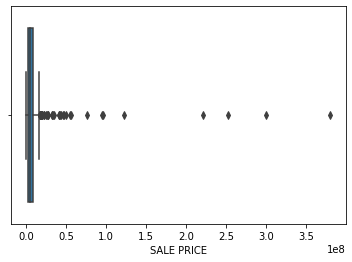

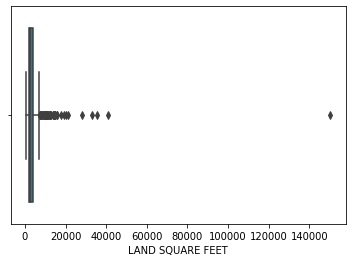

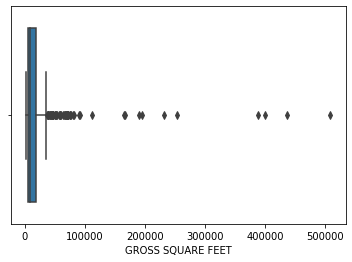

In [20]:
# identifying outliers
boxplot('SALE PRICE')
boxplot('LAND SQUARE FEET')
boxplot('GROSS SQUARE FEET')

<AxesSubplot:xlabel='YEAR BUILT', ylabel='Count'>

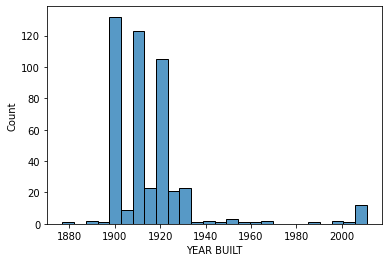

In [21]:
# this is to check that there are any years that seem odd, everything looks realistic so no cleaning required
sns.histplot(data=df, x='YEAR BUILT')

In [22]:
# removing ouliers by getting everything below 0.05 quantile and above 0.95
def remove_outliers(df, column):
    q_low = df[column].quantile(0.05)
    q_hi  = df[column].quantile(0.95)

    df = df[(df[column] < q_hi) & (df[column] > q_low)]

    return df

In [23]:
df = remove_outliers(df, 'SALE PRICE')
df = remove_outliers(df, 'LAND SQUARE FEET')
df = remove_outliers(df, 'GROSS SQUARE FEET')

In [24]:
df.shape

(339, 18)

Skew of Raw data: 1.434584
Kurt of Raw data: 1.944531


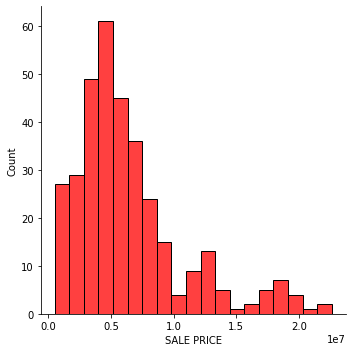

In [25]:
sns.displot(df['SALE PRICE'], color ="r") #Shows the distribution of sale price

print("Skew of Raw data: %f" % df['SALE PRICE'].skew())
print("Kurt of Raw data: %f" % df['SALE PRICE'].kurt())

Skew after 1st Log Transformation: -0.586058
Kurt after 1st Log Transformation: 0.743628


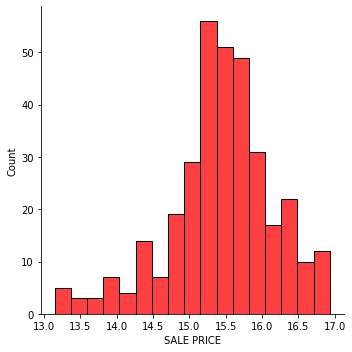

In [26]:
# Reduction of Skewness by taking Logrithm of Variable
SingleLog_y = np.log(df['SALE PRICE']) # Log transformation of the target variable
sns.displot(SingleLog_y, color ="r")

print("Skew after 1st Log Transformation: %f" % SingleLog_y.skew())
print("Kurt after 1st Log Transformation: %f" % SingleLog_y.kurt())

In [27]:
# log of sale prices
df['LN SALE PRICE'] = np.log(df['SALE PRICE'])

In [28]:
# list all categorical values
df_cat = df.select_dtypes(include=[object])
list(df_cat)

# adding year built to list of categorical columns
df_cat['YEAR BUILT'] = df['YEAR BUILT']

# looping through everything in categroical data list and convert to category
for i in df_cat: 
  df[i] = df[i].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 339 entries, 26 to 27067
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   NEIGHBORHOOD                    339 non-null    category      
 1   BUILDING CLASS CATEGORY         339 non-null    category      
 2   TAX CLASS AT PRESENT            339 non-null    category      
 3   BLOCK                           339 non-null    int64         
 4   LOT                             339 non-null    int64         
 5   BUILDING CLASS AT PRESENT       339 non-null    category      
 6   ADDRESS                         339 non-null    category      
 7   ZIP CODE                        339 non-null    float64       
 8   RESIDENTIAL UNITS               339 non-null    float64       
 9   COMMERCIAL UNITS                339 non-null    float64       
 10  TOTAL UNITS                     339 non-null    float64       
 11  LAN

In [29]:
# label encoding (turning columns containing strings such as 'NEIGHBORHOOD' into data that can be used in prediction model)

# looping through and creating new columns so that original data is still in dataframe
for x in df_cat: #Creates a new category column in the dataframe
  df[x + "_CAT"] = df[x].cat.codes

In [30]:
def normalise(df):
    num_cols=df.select_dtypes(include=[np.number]).copy()
    df_norm=((num_cols-num_cols.min())/(num_cols.max()-num_cols.min()))
    return df_norm

df_norm=normalise(df)

In [31]:
df_norm.head()

,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,TAX CLASS AT TIME OF SALE,SALE PRICE,LN SALE PRICE,NEIGHBORHOOD_CAT,BUILDING CLASS CATEGORY_CAT,TAX CLASS AT PRESENT_CAT,BUILDING CLASS AT PRESENT_CAT,ADDRESS_CAT,BUILDING CLASS AT TIME OF SALE_CAT,YEAR BUILT_CAT
26,0.173952,0.063492,0.017316,0.533333,0.111111,0.565217,0.413839,0.564001,0.333333,0.573118,0.857428,0.0,0.25,0.25,0.20,0.172205,0.20,0.666667
30,0.174403,0.103175,0.017316,0.777778,0.222222,0.826087,0.561303,0.543049,0.333333,0.149141,0.529639,0.0,0.25,0.25,0.20,0.299094,0.20,0.148148
31,0.175304,0.109127,0.017316,0.200000,0.000000,0.195652,0.217333,0.134386,0.333333,0.308453,0.702504,0.0,0.25,0.75,0.12,0.392749,0.12,0.148148
32,0.175304,0.111111,0.017316,0.177778,0.000000,0.173913,0.217333,0.130563,0.333333,0.308453,0.702504,0.0,0.25,0.75,0.12,0.377644,0.12,0.148148
33,0.175304,0.113095,0.017316,0.177778,0.000000,0.195652,0.217333,0.139547,0.333333,0.308453,0.702504,0.0,0.25,0.75,0.12,0.359517,0.12,0.148148


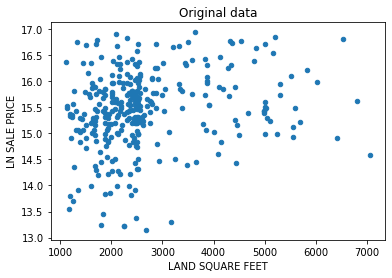

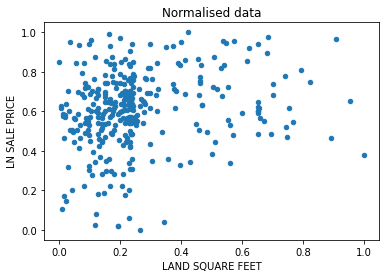

In [32]:
def scatter_plot(df, x, y, title):
    df.plot.scatter(x=x, y=y, title=title)
    plt.show()

# show comparison of scales between original and normalised data
scatter_plot(df, 'LAND SQUARE FEET', 'LN SALE PRICE', 'Original data')
scatter_plot(df_norm, 'LAND SQUARE FEET', 'LN SALE PRICE', 'Normalised data')

In [33]:
df.head()

,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ADDRESS,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,...,SALE PRICE,SALE DATE,LN SALE PRICE,NEIGHBORHOOD_CAT,BUILDING CLASS CATEGORY_CAT,TAX CLASS AT PRESENT_CAT,BUILDING CLASS AT PRESENT_CAT,ADDRESS_CAT,BUILDING CLASS AT TIME OF SALE_CAT,YEAR BUILT_CAT
26,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,397,33,C7,14 AVENUE B,10009.0,25.0,2.0,...,13185684.0,2013-01-31,16.394642,0,2,1,5,57,5,18
30,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,398,53,C7,170 EAST 2ND STREET,10009.0,36.0,3.0,...,3810602.0,2012-10-26,15.153298,0,2,1,5,99,5,4
31,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,400,56,C4,203 EAST 4TH STREET,10009.0,10.0,1.0,...,7333333.0,2013-04-09,15.807941,0,2,3,3,130,3,4
32,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,400,57,C4,201 EAST 4TH STREET,10009.0,9.0,1.0,...,7333333.0,2013-04-09,15.807941,0,2,3,3,125,3,4
33,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,400,58,C4,199 EAST 4TH STREET,10009.0,9.0,1.0,...,7333333.0,2013-04-09,15.807941,0,2,3,3,119,3,4


Data Exploration

In [34]:
def line_plot(df, x):
    sns.lineplot(data=df, x=x, y='SALE PRICE')
    plt.show()

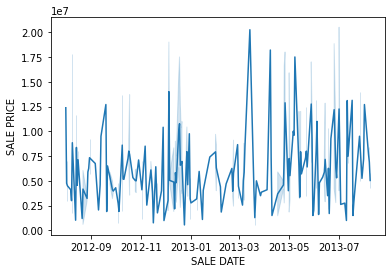

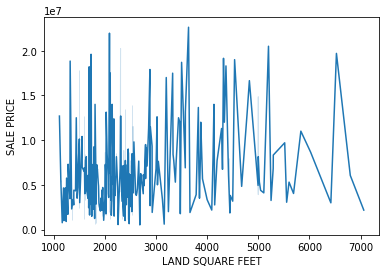

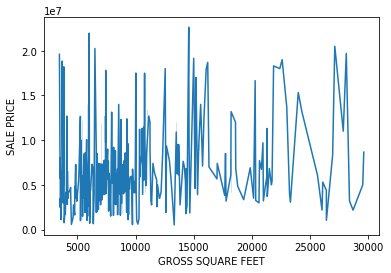

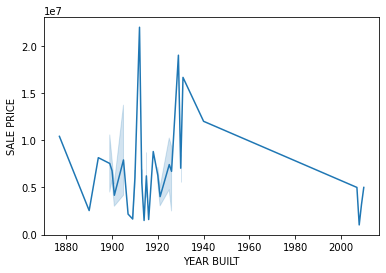

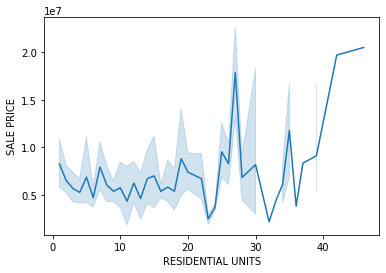

In [35]:
line_plot(df, 'SALE DATE')
line_plot(df, 'LAND SQUARE FEET')
line_plot(df, 'GROSS SQUARE FEET')
line_plot(df, 'YEAR BUILT')
line_plot(df, 'RESIDENTIAL UNITS')

In [36]:
def bar_plot(df, x):
    plt.figure(figsize=(40,10))
    sns.barplot(data=df, x=x, y='SALE PRICE')
    plt.show()

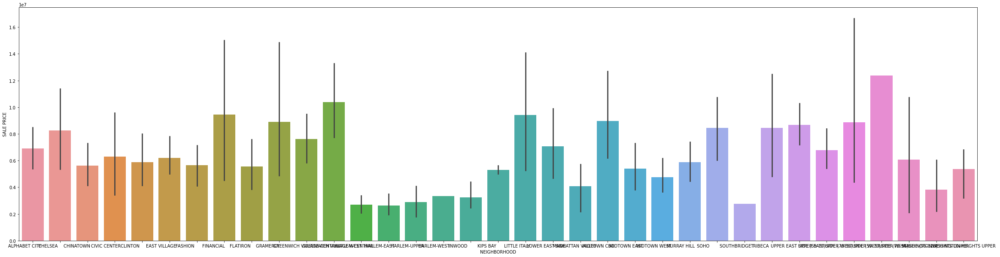

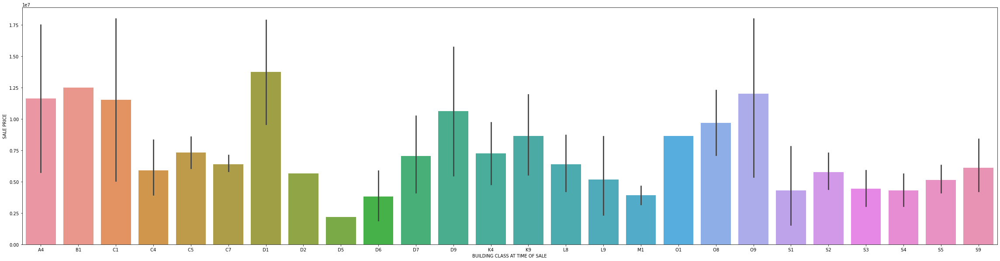

In [37]:
bar_plot(df, 'NEIGHBORHOOD')
# there does seem to be a correlation between class of building and price (i.e D1 seems to sell for a lot) but not enough information in glossary about codes (like D1) to infer anything 
bar_plot(df, 'BUILDING CLASS AT TIME OF SALE')

<AxesSubplot:xlabel='SALE DATE', ylabel='SALE PRICE'>

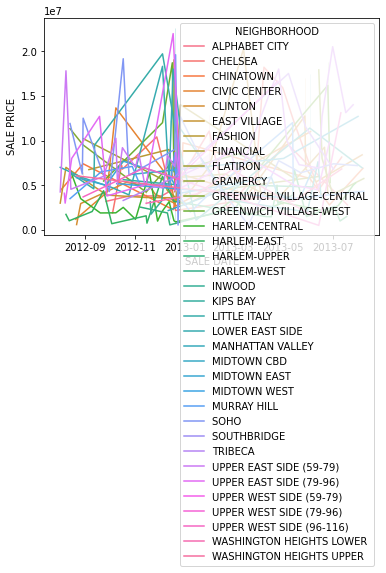

In [38]:
sns.lineplot(data=df, x='SALE DATE', y='SALE PRICE', hue='NEIGHBORHOOD')

In [39]:
# line plot above is very messy and unreadable so different line graphs will be created for each neighbourhood
neighbourhoods = df['NEIGHBORHOOD'].unique()

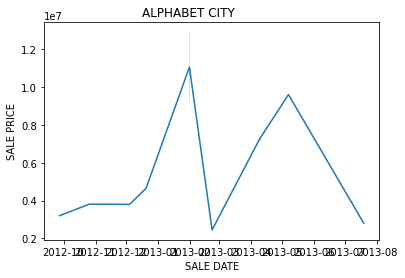

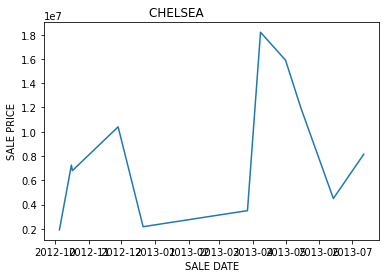

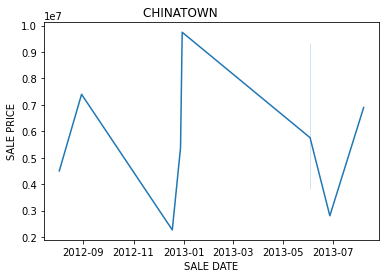

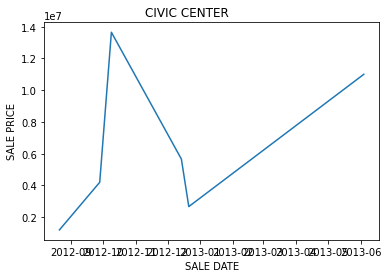

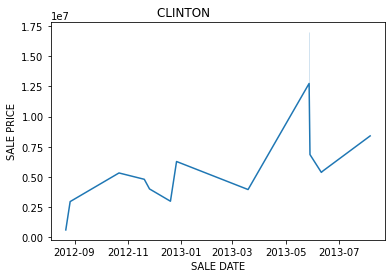

...

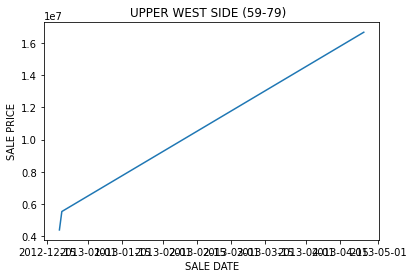

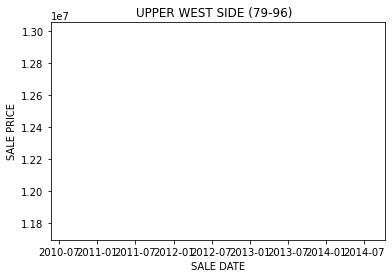

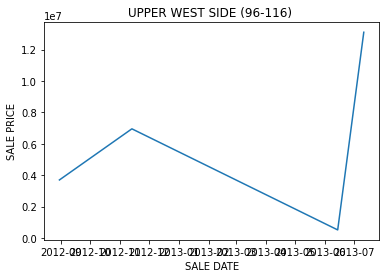

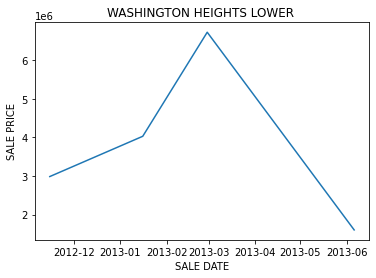

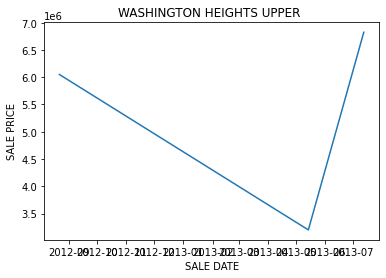

In [40]:
# create separate date/price line graph for each neighbourhood
def neighbourhood_price_date(df, neighbourhood):
    this_neighbourhood = df.query("NEIGHBORHOOD == " + "'" + neighbourhood + "'")
    sns.lineplot(data=this_neighbourhood, x='SALE DATE', y='SALE PRICE').set(title=neighbourhood)
    plt.show()


for i in neighbourhoods:
    neighbourhood_price_date(df, i)

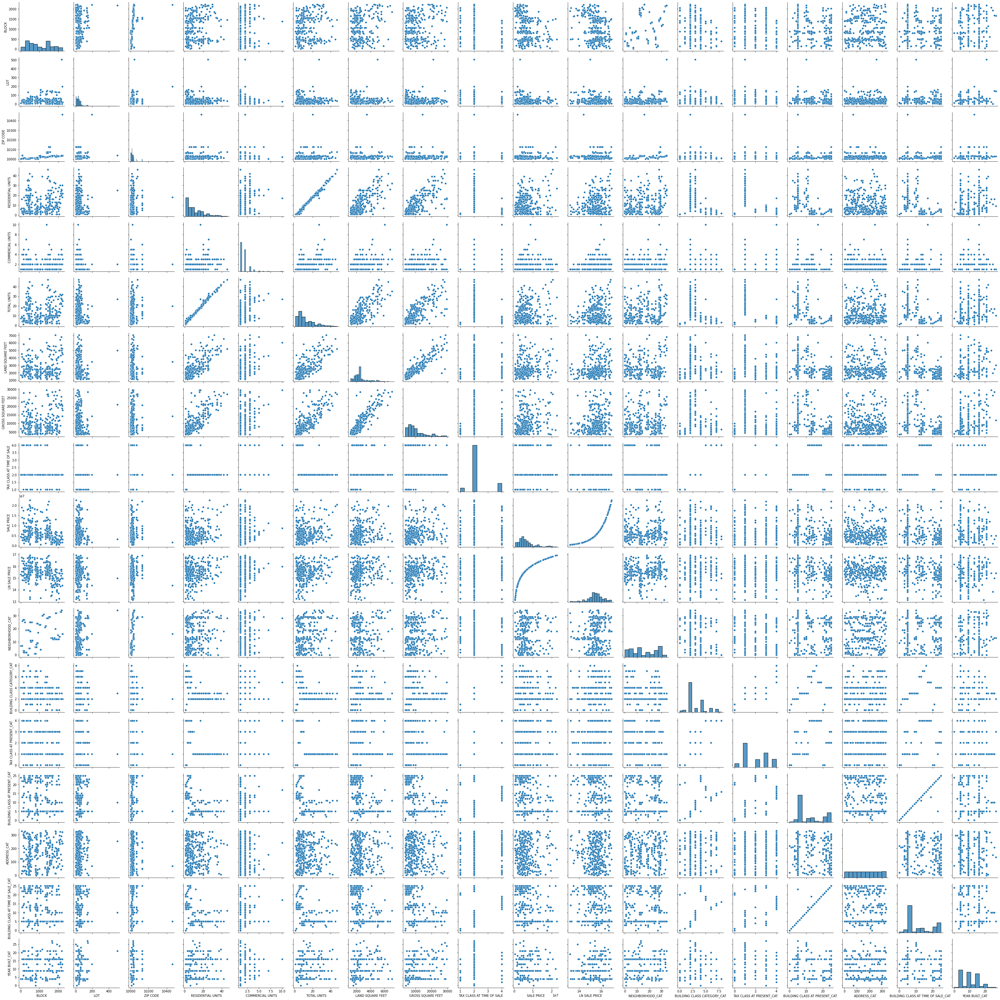

In [41]:
sns.pairplot(df) # generates matrix of scatterplots/histograms to show correlation

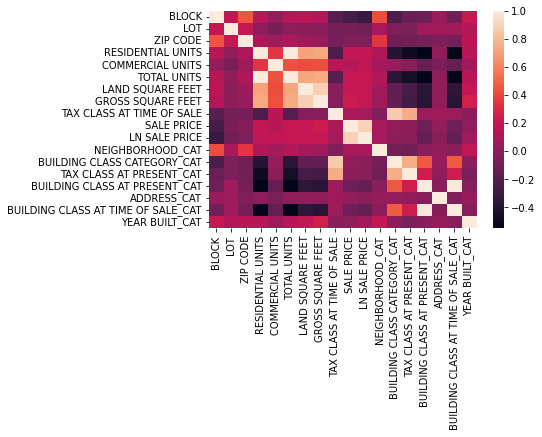

In [42]:
def correlation_matrix(df):
    corr = df.corr()
    sns.heatmap(corr)

correlation_matrix(df)

Model Building

In [43]:
# training a linear regression model
clf = LinearRegression()
feature_columns =["RESIDENTIAL UNITS", "COMMERCIAL UNITS", "TOTAL UNITS","LAND SQUARE FEET", "GROSS SQUARE FEET","NEIGHBORHOOD_CAT", "YEAR BUILT_CAT"]

X = df_norm[feature_columns]
Y = df_norm['LN SALE PRICE']

In [44]:
# splitting train/test data 
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

clf.fit(X_train, Y_train)

LinearRegression()

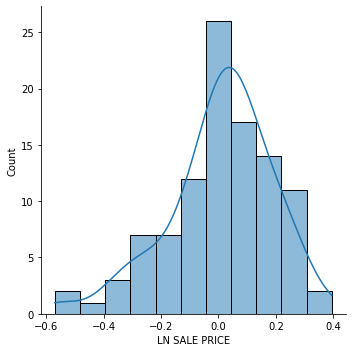

In [45]:
def model_hist(model, X, Y):
    pred_Y= model.predict(X)
    res = Y - pred_Y
    sns.displot(res, kde=True)
    plt.show()

model_hist(clf, X_test, Y_test)

In [46]:
def cross_val_mean(model, X, Y):
    return np.mean(cross_val_score(model, X, Y, cv=3, scoring='r2'))

score = cross_val_mean(clf, X_test, Y_test)
print(score)

0.05144114435172905


## Part 2.1

### Data Preparation + Cleaning

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn import feature_selection, linear_model, model_selection
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn import preprocessing
import sklearn.cluster as cluster
import sklearn.metrics as metrics
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error

In [48]:
# read csv
df = pd.read_csv('Manhattan12.csv', header = 4)
df = df.iloc[18:] #delete first 18 rows due to lack of data
df.shape

(27377, 21)

In [49]:
df.head()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APART\nMENT\nNUMBER,...,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE\nPRICE,SALE DATE
18,1,ALPHABET CITY,03 THREE FAMILY HOMES,1,377,66,,C0,243 EAST 7TH STREET,,...,3,0,3,"2,381","3,084",1899,1,C0,"$3,150,000",06/03/2013
19,1,ALPHABET CITY,04 TAX CLASS 1 CONDOS,1C,399,1102,,R6,238 EAST 4TH STREET,-,...,1,0,1,0,0,1955,1,R6,"$3,450,000",27/03/2013
20,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,374,1,,C7,303 EAST 4TH STREET,,...,8,2,10,"1,501","6,929",1900,2,C7,$0,05/02/2013
21,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,375,62,,C4,715 EAST 5TH STREET,,...,20,0,20,"2,426","9,345",1900,2,C4,"$3,650,000",06/09/2012
22,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,376,30,,C4,274 EAST SEVENTH STREET,,...,13,0,13,"2,726","13,002",1910,2,C4,"$895,250",25/10/2012


In [50]:
df = df.rename(columns={"SALE\nPRICE":"SALE PRICE", "APART\nMENT\nNUMBER":"APARTMENT NUMBER"}) #rename columns

In [51]:
df = df.drop(columns=['BOROUGH', 'EASE-MENT', 'APARTMENT NUMBER'])

In [52]:
def change_column_type(column, new_type):
  df[column] = df[column].astype(new_type)

In [53]:
price_to_int('SALE PRICE')
price_to_int('LAND SQUARE FEET')
price_to_int('GROSS SQUARE FEET')
price_to_int('TOTAL UNITS')
price_to_int('RESIDENTIAL UNITS')

In [54]:
def remove_whitespace(column): # removes whitespace from front and behind text
  df[column] = df[column].str.strip()

In [55]:
remove_whitespace("BUILDING CLASS CATEGORY") 
remove_whitespace("NEIGHBORHOOD")

In [56]:
change_column_type("ZIP CODE", str)
change_column_type("LOT", str)
change_column_type("BLOCK", str)
change_column_type("TAX CLASS AT TIME OF SALE", str)

In [57]:
# list all numerical variables 
df_nums = df.select_dtypes(include=[np.number])
list(df_nums)

['RESIDENTIAL UNITS',
 'COMMERCIAL UNITS',
 'TOTAL UNITS',
 'LAND SQUARE FEET',
 'GROSS SQUARE FEET',
 'YEAR BUILT',
 'SALE PRICE']

In [58]:
# list all categorical values
df_cat = df.select_dtypes(include=[object])
list(df_cat)

['NEIGHBORHOOD',
 'BUILDING CLASS CATEGORY',
 'TAX CLASS AT PRESENT',
 'BLOCK',
 'LOT',
 'BUILDING CLASS AT PRESENT',
 'ADDRESS',
 'ZIP CODE',
 'TAX CLASS AT TIME OF SALE',
 'BUILDING CLASS AT TIME OF SALE',
 'SALE DATE']

In [59]:
df['SALE DATE'] = pd.to_datetime(df['SALE DATE'], dayfirst=True) # convert sale date to datetime

In [60]:
# replace 0 with NaN
df.replace(0, np.nan, inplace=True) 
df.replace("0", np.nan, inplace=True)

pd.isnull(df).sum()

NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
BUILDING CLASS AT PRESENT             0
ADDRESS                               0
ZIP CODE                              1
RESIDENTIAL UNITS                 16354
COMMERCIAL UNITS                  23944
TOTAL UNITS                        9687
LAND SQUARE FEET                  22888
GROSS SQUARE FEET                 23051
YEAR BUILT                         6424
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                         7593
SALE DATE                             0
dtype: int64

In [61]:
# finding out how many dupliactes there are by subtracting duplicates from 'drop duplicates' from entire dataframe
len(df)-len(df.drop_duplicates())

1593

In [62]:
df.drop_duplicates(keep='first', inplace=True)
df.dropna(subset=['ZIP CODE'], inplace=True)

df.shape

(25783, 18)

In [63]:
pd.isnull(df).sum()

NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
BUILDING CLASS AT PRESENT             0
ADDRESS                               0
ZIP CODE                              0
RESIDENTIAL UNITS                 14996
COMMERCIAL UNITS                  23125
TOTAL UNITS                        9617
LAND SQUARE FEET                  22119
GROSS SQUARE FEET                 22268
YEAR BUILT                         5826
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                         6872
SALE DATE                             0
dtype: int64

In [64]:
def interpolate_column(column, mode, direction): #interpolate the column to fill missing value
  if mode == "pad":
    df[column] = df[column].interpolate(method = mode)
  else:
    df[column] = df[column].interpolate(method = mode, limit_direction = direction)

In [65]:
#Using linear interpolation to fill in the missing gaps in all the data.
interpolate_column("GROSS SQUARE FEET", "linear", "both")
interpolate_column("LAND SQUARE FEET", "linear", "both")
interpolate_column("YEAR BUILT", "linear", "both")
interpolate_column("COMMERCIAL UNITS", "linear", "both")
interpolate_column("RESIDENTIAL UNITS", "linear", "both")
interpolate_column("SALE PRICE", "linear", "both")
interpolate_column("BUILDING CLASS CATEGORY", "pad", None)

pd.isnull(df).sum()

NEIGHBORHOOD                         0
BUILDING CLASS CATEGORY              0
TAX CLASS AT PRESENT                 0
BLOCK                                0
LOT                                  0
BUILDING CLASS AT PRESENT            0
ADDRESS                              0
ZIP CODE                             0
RESIDENTIAL UNITS                    0
COMMERCIAL UNITS                     0
TOTAL UNITS                       9617
LAND SQUARE FEET                     0
GROSS SQUARE FEET                    0
YEAR BUILT                           0
TAX CLASS AT TIME OF SALE            0
BUILDING CLASS AT TIME OF SALE       0
SALE PRICE                           0
SALE DATE                            0
dtype: int64

In [66]:
columns_to_int = ["COMMERCIAL UNITS", "RESIDENTIAL UNITS", "LAND SQUARE FEET", "GROSS SQUARE FEET", "SALE PRICE", "YEAR BUILT"]

for x in columns_to_int: # Loop through the array to change type to int
  change_column_type(x, int)

In [67]:
df['TOTAL UNITS'] = df['RESIDENTIAL UNITS'] + df['COMMERCIAL UNITS'] #Add the residential and commercial units together
df["TOTAL UNITS"] = df["TOTAL UNITS"].apply(int)

In [68]:
df.dtypes

NEIGHBORHOOD                              object
BUILDING CLASS CATEGORY                   object
TAX CLASS AT PRESENT                      object
BLOCK                                     object
LOT                                       object
BUILDING CLASS AT PRESENT                 object
ADDRESS                                   object
ZIP CODE                                  object
RESIDENTIAL UNITS                          int32
COMMERCIAL UNITS                           int32
TOTAL UNITS                                int64
LAND SQUARE FEET                           int32
GROSS SQUARE FEET                          int32
YEAR BUILT                                 int32
TAX CLASS AT TIME OF SALE                 object
BUILDING CLASS AT TIME OF SALE            object
SALE PRICE                                 int32
SALE DATE                         datetime64[ns]
dtype: object

In [69]:
df.loc[:, ~df.columns.isin(['ZIP CODE', 'BLOCK', 'LOT', 'TIME OF SALE', 'TAX CLASS AT TIME OF SALE'])].describe() #Shows the mathematical statistics of each numerical variable

,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,SALE PRICE
count,25783.000000,25783.000000,25783.000000,25783.000000,2.578300e+04,25783.000000,2.578300e+04
mean,39.194780,2.138502,41.333282,9348.552108,7.054211e+04,1951.857619,4.144339e+06
std,83.682712,5.297819,83.882421,12158.855454,1.011706e+05,36.260166,2.979704e+07
min,1.000000,1.000000,2.000000,200.000000,2.530000e+02,1000.000000,1.000000e+00
25%,1.000000,1.000000,2.000000,2595.000000,1.124500e+04,1923.000000,3.850000e+05
50%,6.000000,1.000000,9.000000,5707.000000,3.367100e+04,1952.000000,8.200000e+05
75%,38.000000,2.000000,40.000000,10098.500000,1.024245e+05,1985.000000,1.920500e+06
max,1328.000000,604.000000,1349.000000,213650.000000,1.970736e+06,2013.000000,1.307965e+09


In [70]:
def boxplot(column): 
    sns.boxplot(x=df[column])
    plt.show()

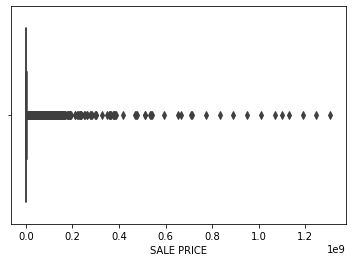

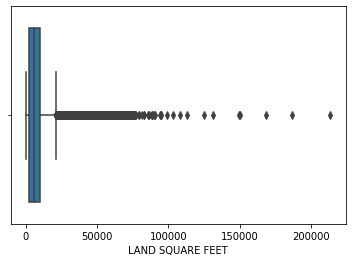

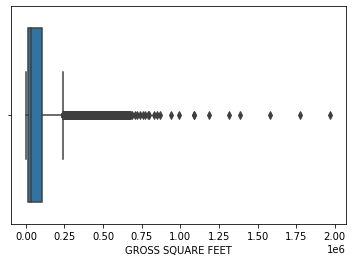

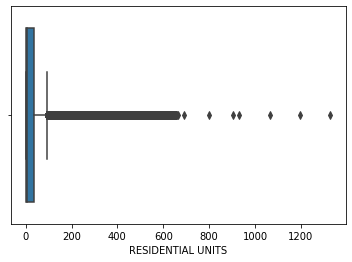

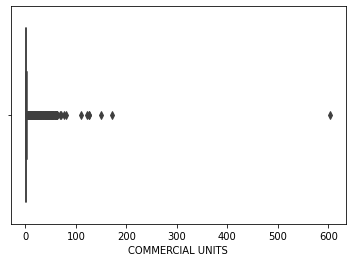

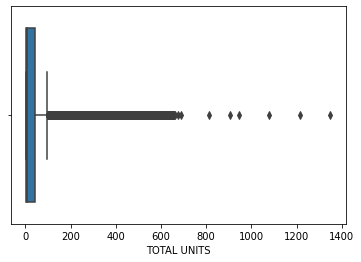

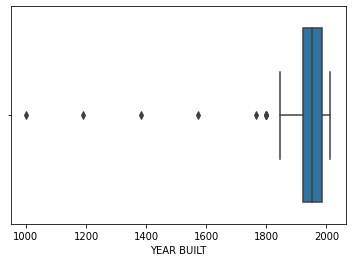

In [71]:
# identifying outliers
check_outlier_columns = ['SALE PRICE', 'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT']

for x in check_outlier_columns:
  boxplot(x)

In [72]:
df.shape

(25783, 18)

In [73]:
def remove_outliers(df, column, direction): #Removes outliers by dropping rows which values exceed or are below 1.96 standard deviation away from mean
    q_low = df[column].quantile(0.025)
    q_hi  = df[column].quantile(0.975)
    print(column, q_low)
    if direction == "both":
      df = df[(df[column] < q_hi) & (df[column] > q_low)]
    elif direction == "higher":
      df = df[(df[column] < q_hi)]
    elif direction == "lower":
      df = df[(df[column] > q_low)]

    return df

In [74]:
df = remove_outliers(df, "YEAR BUILT", "both")
df = remove_outliers(df, "COMMERCIAL UNITS", "higher")
df = remove_outliers(df, "RESIDENTIAL UNITS", "higher")
df = remove_outliers(df, "TOTAL UNITS", "higher")
df = remove_outliers(df, "GROSS SQUARE FEET", "both")
df = remove_outliers(df, "LAND SQUARE FEET", "both")
df = remove_outliers(df, "SALE PRICE", "both")

YEAR BUILT 1900.0
COMMERCIAL UNITS 1.0
RESIDENTIAL UNITS 1.0
TOTAL UNITS 2.0
GROSS SQUARE FEET 3772.0
LAND SQUARE FEET 1573.0
SALE PRICE 200.0


In [75]:
print(df.shape)
print(df["SALE PRICE"][df["SALE PRICE"] < 200000].count()) #Manually remove properties that are sold for less than 200k
df.drop(df[df['SALE PRICE'] <= 200000].index, inplace = True)

(18427, 18)
3640


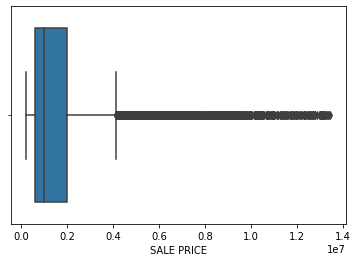

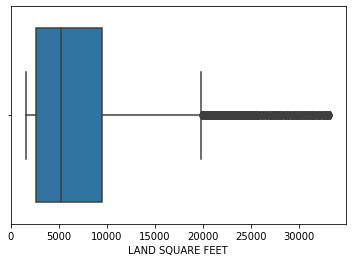

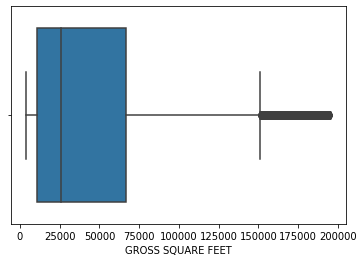

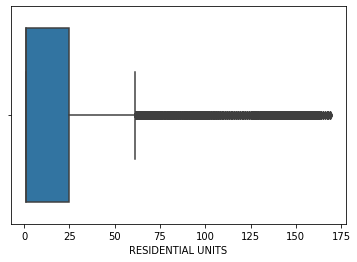

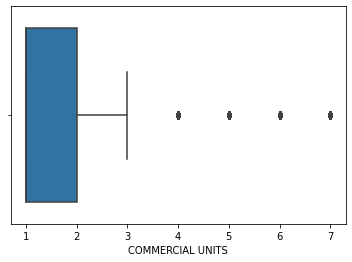

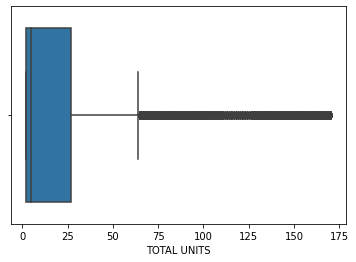

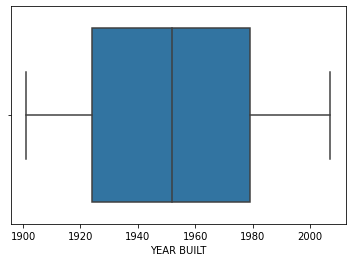

In [76]:
# checking if outliers r gone
check_outlier_columns = ['SALE PRICE', 'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT']

for x in check_outlier_columns:
  boxplot(x)

In [77]:
df.drop(df.loc[df['BUILDING CLASS CATEGORY']=="25  LUXURY HOTELS"].index, inplace=True) #remove due to bad interpolation
df[df["BUILDING CLASS CATEGORY"] == "25  LUXURY HOTELS"].shape

(0, 18)

In [78]:
df["YEAR BUILT"] = df["YEAR BUILT"].astype(object) #now turn it back to categorical
df_cat = df.select_dtypes(include=[object]) #update the categorical list
list(df_cat)

['NEIGHBORHOOD',
 'BUILDING CLASS CATEGORY',
 'TAX CLASS AT PRESENT',
 'BLOCK',
 'LOT',
 'BUILDING CLASS AT PRESENT',
 'ADDRESS',
 'ZIP CODE',
 'YEAR BUILT',
 'TAX CLASS AT TIME OF SALE',
 'BUILDING CLASS AT TIME OF SALE']

In [79]:
for x in df_cat: #Convert the categorical list to category type instead of object.
  change_column_type(x, 'category')
  #df[x] = df[x].astype('category')

In [80]:
df.shape

(14760, 18)

In [81]:
for x in df_cat: #Creates a new category column in the dataframe
  df[x + "_CAT"] = df[x].cat.codes

Skew of Raw data: 2.745294
Kurt of Raw data: 8.722252


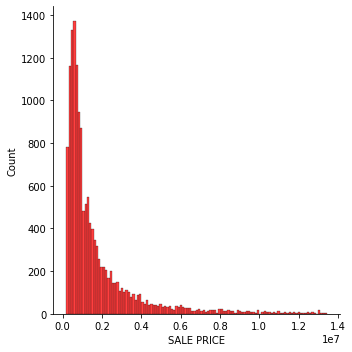

In [82]:
sns.displot(df['SALE PRICE'], color ="r") #Shows the distribution of sale price

print("Skew of Raw data: %f" % df['SALE PRICE'].skew())
print("Kurt of Raw data: %f" % df['SALE PRICE'].kurt())

Skew after 1st Log Transformation: 0.510637
Kurt after 1st Log Transformation: -0.296086


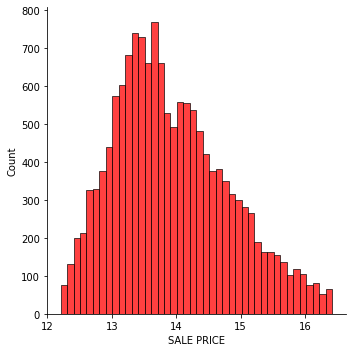

In [83]:
# Reduction of Skewness by taking Logrithm of Variable
SingleLog_y = np.log1p(df['SALE PRICE']) # Log transformation of the target variable
sns.displot(SingleLog_y, color ="r")

print("Skew after 1st Log Transformation: %f" % SingleLog_y.skew())
print("Kurt after 1st Log Transformation: %f" % SingleLog_y.kurt())

Skew after 2nd Log Transformation: 0.384980
Kurt after 2nd Log Transformation: -0.436576


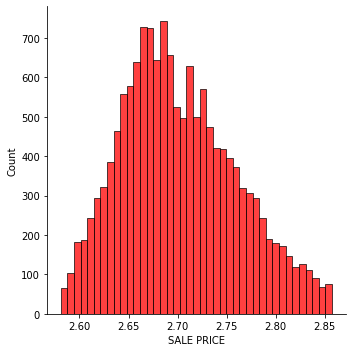

In [84]:
# Further Reduction of Skewness by taking Logrithm of Logrithm
DoubleLog_y = np.log1p(SingleLog_y)
df["LN SALE PRICE"] = DoubleLog_y #Create a new column in the data frame for the log sale prices

sns.displot(DoubleLog_y, color ="r")
print("Skew after 2nd Log Transformation: %f" % DoubleLog_y.skew())
print("Kurt after 2nd Log Transformation: %f" % DoubleLog_y.kurt())

In [85]:
columns_to_normalise = ["RESIDENTIAL UNITS", "COMMERCIAL UNITS", "TOTAL UNITS", "LAND SQUARE FEET", "GROSS SQUARE FEET", "SALE PRICE", "LN SALE PRICE"]

def normalise(df): # Normalises the columns that are in the columns_to_normalise array
  df_norm = df.copy()
  df_norm[columns_to_normalise] = df_norm[columns_to_normalise].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
  return df_norm

df_norm=normalise(df)

In [86]:
df_norm.head()

,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,BUILDING CLASS AT PRESENT,ADDRESS,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,...,TAX CLASS AT PRESENT_CAT,BLOCK_CAT,LOT_CAT,BUILDING CLASS AT PRESENT_CAT,ADDRESS_CAT,ZIP CODE_CAT,YEAR BUILT_CAT,TAX CLASS AT TIME OF SALE_CAT,BUILDING CLASS AT TIME OF SALE_CAT,LN SALE PRICE
19,ALPHABET CITY,04 TAX CLASS 1 CONDOS,1C,399,1102,R6,238 EAST 4TH STREET,10009,0.000000,0.166667,...,3,821,109,70,3837,7,54,0,68,0.705604
22,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,376,30,C4,274 EAST SEVENTH STREET,10009,0.071429,0.000000,...,4,808,1079,13,4442,7,9,1,12,0.388137
26,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,397,33,C7,14 AVENUE B,10009,0.142857,0.166667,...,4,819,1157,16,1200,7,24,1,15,0.995721
34,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,400,60,C4,195 EAST FOURTH STREET,10009,0.101190,0.166667,...,4,822,1451,13,2470,7,12,1,12,0.861597
36,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,404,4,C7,500 EAST 11 STREET,10009,0.142857,0.166667,...,4,824,1244,16,7097,7,19,1,15,0.986327


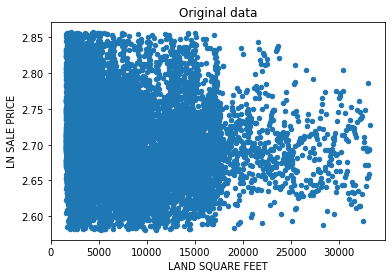

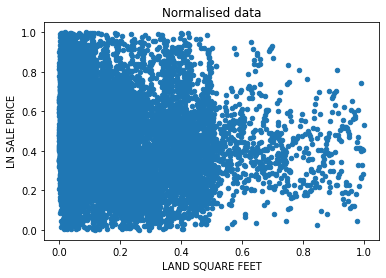

In [87]:
def scatter_plot(df, x, y, title):
    df.plot.scatter(x=x, y=y, title=title)
    plt.show()

#Show the new normalised data where the data is scaled from 0 to 1.
scatter_plot(df, 'LAND SQUARE FEET', 'LN SALE PRICE', 'Original data')
scatter_plot(df_norm, 'LAND SQUARE FEET', 'LN SALE PRICE', 'Normalised data')

count    14760.000000
mean         2.701781
std          0.058789
min          2.580866
25%          2.658573
50%          2.694103
75%          2.741398
max          2.857345
Name: LN SALE PRICE, dtype: float64

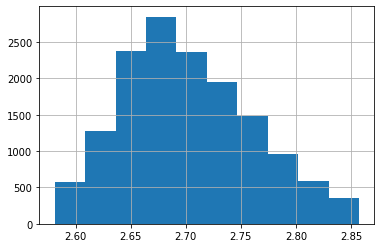

In [88]:
df['LN SALE PRICE'].hist()
df['LN SALE PRICE'].describe()

In [89]:
df.dtypes

NEIGHBORHOOD                                category
BUILDING CLASS CATEGORY                     category
TAX CLASS AT PRESENT                        category
BLOCK                                       category
LOT                                         category
BUILDING CLASS AT PRESENT                   category
ADDRESS                                     category
ZIP CODE                                    category
RESIDENTIAL UNITS                              int32
COMMERCIAL UNITS                               int32
TOTAL UNITS                                    int64
LAND SQUARE FEET                               int32
GROSS SQUARE FEET                              int32
YEAR BUILT                                  category
TAX CLASS AT TIME OF SALE                   category
BUILDING CLASS AT TIME OF SALE              category
SALE PRICE                                     int32
SALE DATE                             datetime64[ns]
NEIGHBORHOOD_CAT                              

In [464]:
df.shape

(14760, 30)

### Data Visualisation

In [466]:
def line_plot(df, x):
    sns.lineplot(data=df, x=x, y='LN SALE PRICE')
    plt.show()

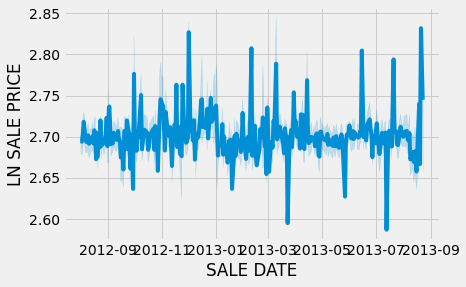

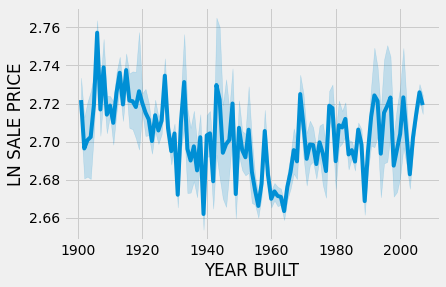

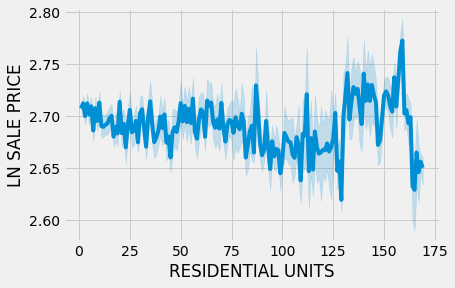

In [467]:
line_plot(df, 'SALE DATE')
line_plot(df, 'YEAR BUILT')
line_plot(df, 'RESIDENTIAL UNITS')

In [468]:
def bar_plot(df, x):
    plt.figure(figsize=(40,10))
    sns.barplot(data=df, x=x, y='SALE PRICE')
    plt.show()

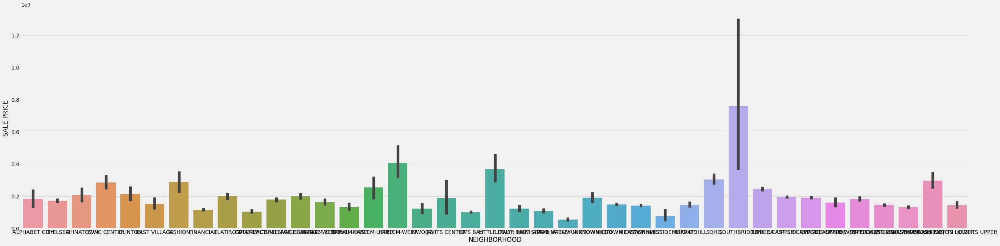

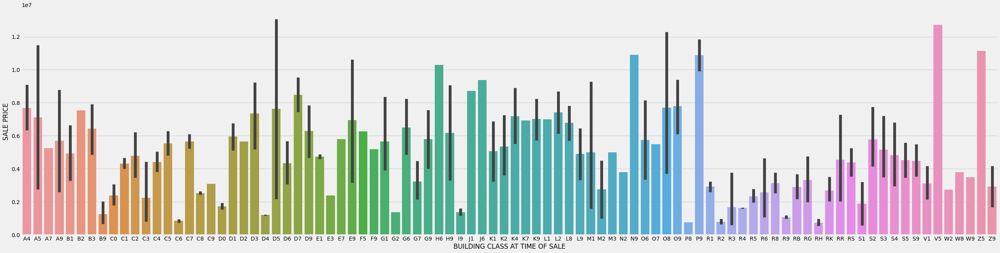

In [469]:
bar_plot(df, 'NEIGHBORHOOD')
# there does seem to be a correlation between class of building and price (i.e D1 seems to sell for a lot) but not enough information in glossary about codes (like D1) to infer anything 
bar_plot(df, 'BUILDING CLASS AT TIME OF SALE')

<Axes: xlabel='SALE DATE', ylabel='SALE PRICE'>

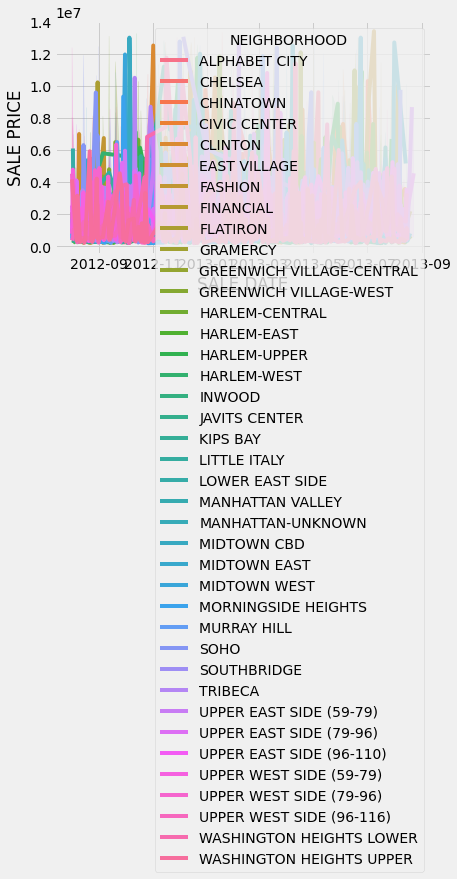

In [470]:
sns.lineplot(data=df, x='SALE DATE', y='SALE PRICE', hue='NEIGHBORHOOD')

In [471]:
# line plot above is very messy and unreadable so different line graphs will be created for each neighbourhood
neighbourhoods = df['NEIGHBORHOOD'].unique()

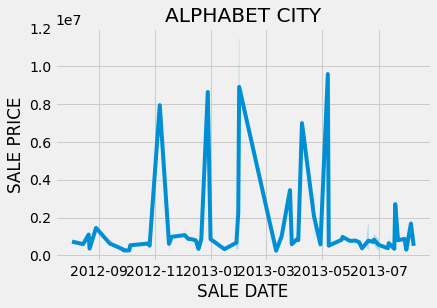

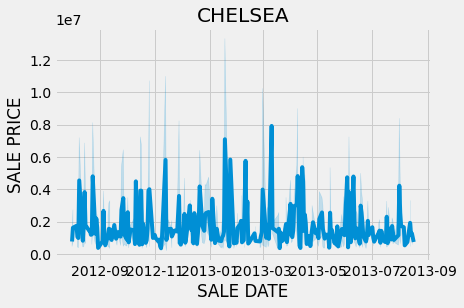

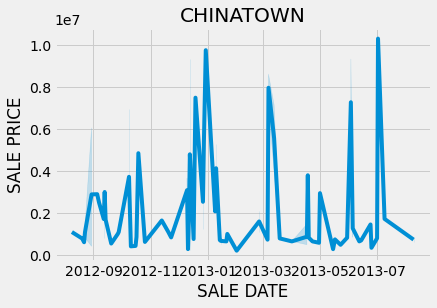

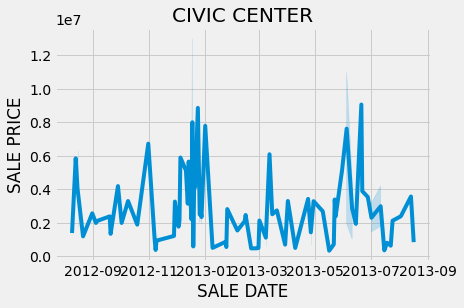

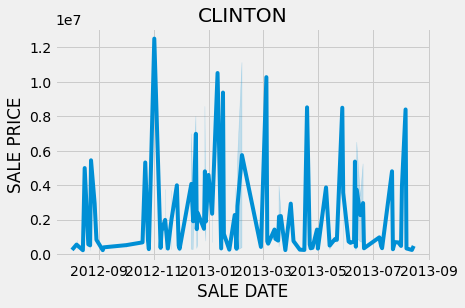

...

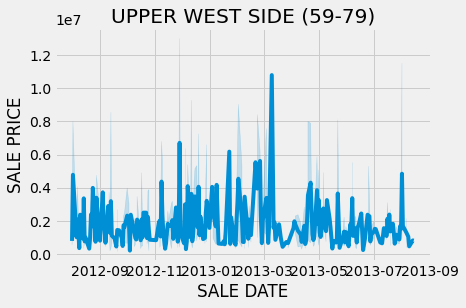

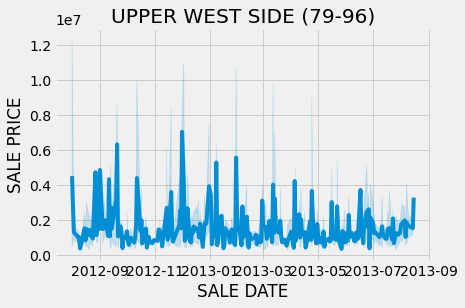

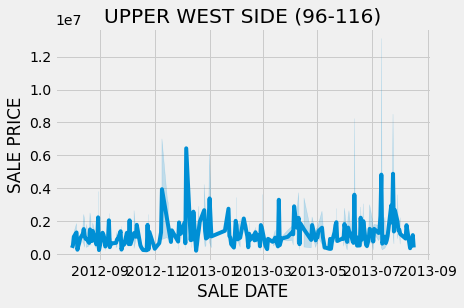

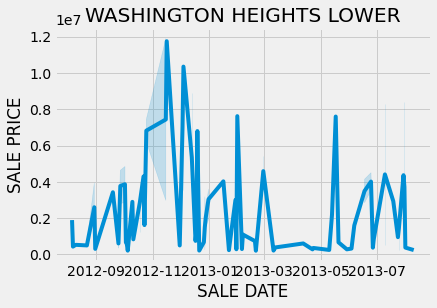

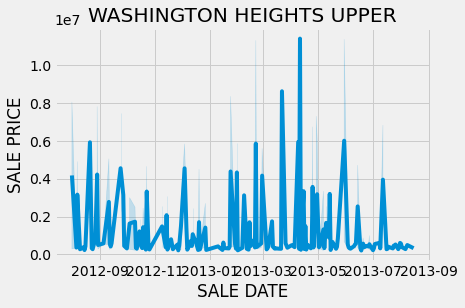

In [472]:
def neighbourhood_price_date(df, neighbourhood):
    this_neighbourhood = df.query("NEIGHBORHOOD == " + "'" + neighbourhood + "'")
    sns.lineplot(data=this_neighbourhood, x='SALE DATE', y='SALE PRICE').set(title=neighbourhood)
    plt.show()


for i in neighbourhoods:
    neighbourhood_price_date(df, i)

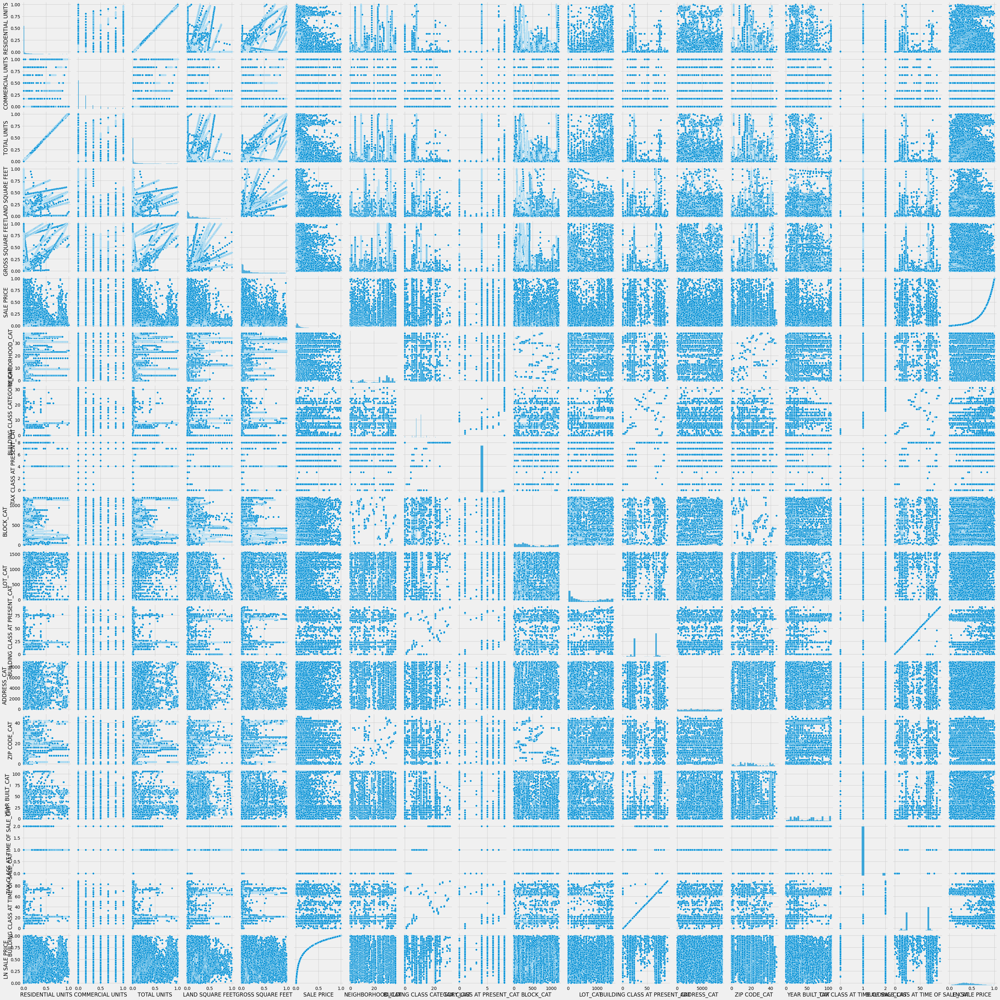

In [473]:
sns.pairplot(df_norm) #Generates graphs to see how each pair of variables relate to each other

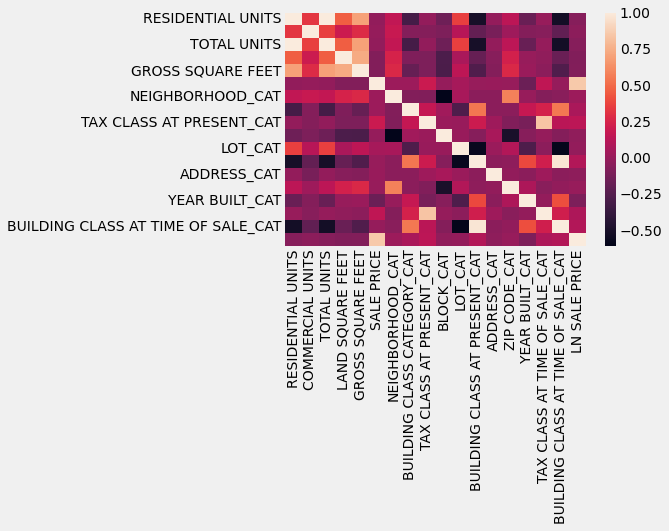

In [474]:
def correlation_matrix(df): #Generate a correlation matrix to show how well each vairable correlates
    corr = df.corr()
    sns.heatmap(corr)

correlation_matrix(df)

### Model Building

#### Random Forest Regression

In [495]:
# NOTE: max iter was changed to avoid 'The max_iter was reached' warning, also type of 'solver' was changed to avoid another warning
feature_columns = ["RESIDENTIAL UNITS", "LAND SQUARE FEET", "NEIGHBORHOOD_CAT", "BUILDING CLASS CATEGORY_CAT", "TAX CLASS AT PRESENT_CAT", "BLOCK_CAT", "BUILDING CLASS AT PRESENT_CAT", "ADDRESS_CAT", "ZIP CODE_CAT", "YEAR BUILT_CAT", "TAX CLASS AT TIME OF SALE_CAT", "BUILDING CLASS AT TIME OF SALE_CAT"]

df_train = df[feature_columns].copy() #Create a new dataframe which only includes the feature and sale price columns
df_train["SALE PRICE"] = df_norm["SALE PRICE"]
df_train["LN SALE PRICE"] = df_norm["LN SALE PRICE"]

X = df_train[feature_columns]
Y = df_train["LN SALE PRICE"]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=42) # Split the X and Y variable to training and data set of 75%/25%.

print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', Y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', Y_test.shape)

Training Features Shape: (11070, 12)
Training Labels Shape: (11070,)
Testing Features Shape: (3690, 12)
Testing Labels Shape: (3690,)


In [496]:
# Use random forest regressor to model the data.
rf = RandomForestRegressor(n_estimators = 1400, min_samples_split = 5, min_samples_leaf = 1, max_features = "sqrt", max_depth = 30, bootstrap = True, random_state = 42)

rf.fit(X_train, Y_train)

RandomForestRegressor(max_depth=30, max_features='sqrt', min_samples_split=5,
                      n_estimators=1400, random_state=42)

In [497]:
y_pred = rf.predict(X_test)

#Show the predictions
_preds_df = pd.DataFrame(dict(observed=Y_test, predicted=y_pred))
_preds_df.head()

,observed,predicted
2913,0.371255,0.332616
6219,0.360052,0.348431
6041,0.344330,0.280750
25306,0.427144,0.368989
2921,0.400115,0.422095


In [498]:
# Calculate the absolute errors
errors = abs(y_pred - Y_test)
# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / Y_test)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 56.88 %.


In [499]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_columns, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: LAND SQUARE FEET     Importance: 0.16
Variable: BLOCK_CAT            Importance: 0.13
Variable: ADDRESS_CAT          Importance: 0.13
Variable: YEAR BUILT_CAT       Importance: 0.11
Variable: BUILDING CLASS CATEGORY_CAT Importance: 0.09
Variable: NEIGHBORHOOD_CAT     Importance: 0.07
Variable: BUILDING CLASS AT PRESENT_CAT Importance: 0.07
Variable: ZIP CODE_CAT         Importance: 0.07
Variable: BUILDING CLASS AT TIME OF SALE_CAT Importance: 0.07
Variable: RESIDENTIAL UNITS    Importance: 0.06
Variable: TAX CLASS AT PRESENT_CAT Importance: 0.03
Variable: TAX CLASS AT TIME OF SALE_CAT Importance: 0.01


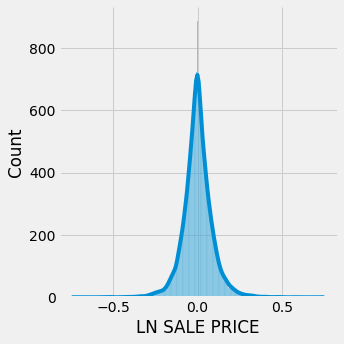

In [500]:
def model_hist(model, X, Y):
    pred_Y= model.predict(X)
    res = Y - pred_Y
    sns.displot(res, kde=True)
    plt.show()

model_hist(rf, X, Y)

In [508]:
def cross_val_mean(model, X, Y): # Function that will cross validate a model and return the mean R2 accuracy which is used for regression models.
    print("Mean R2 Accuracy: " + str((np.mean(cross_val_score(model, X, Y, cv=3, scoring='r2')))*100) + "%")

In [509]:
cross_val_mean(rf, X_test, Y_test) #Generate a score on the random forest regression model

Mean R2 Accuracy: 53.9658810233559%


#### K Clusters

2 239875328745.6359
4 128741432507.68271
6 74448766390.2904
8 54303903432.71239
10 42167647944.36314


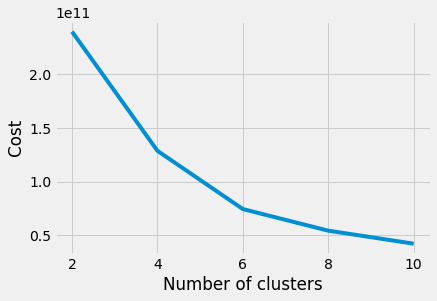

In [512]:
def elbow(data): #Generate a graph to show the score on each k cluster ranging from 2 to 11
    sse = {}
    for k in range(2, 11, 2):
        kmeans = KMeans(n_clusters=k, max_iter=1000, n_init=10).fit(data)
        print(k, kmeans.inertia_)
        sse[k] = kmeans.inertia_  
        # Inertia: Sum of distances of samples to their closest cluster center
    plt.figure()
    plt.plot(list(sse.keys()), list(sse.values()), linewidth=4)
    plt.xlabel("Number of clusters")
    plt.ylabel("Cost")
    plt.show()
    
elbow(X)

In [513]:
cluster_amount = 6

km = KMeans(n_clusters=cluster_amount, n_init=10) # Create a K Means cluster with k = 6
y_predicted = km.fit(X)

In [514]:
clust_labels = km.labels_ # Obtain the cluster labels from K Means and then assign to the "CLUSTER" column
md = pd.Series(clust_labels)
df_train['CLUSTER'] = pd.Series(clust_labels, index=df.index)
df_train.head()

,RESIDENTIAL UNITS,LAND SQUARE FEET,NEIGHBORHOOD_CAT,BUILDING CLASS CATEGORY_CAT,TAX CLASS AT PRESENT_CAT,BLOCK_CAT,BUILDING CLASS AT PRESENT_CAT,ADDRESS_CAT,ZIP CODE_CAT,YEAR BUILT_CAT,TAX CLASS AT TIME OF SALE_CAT,BUILDING CLASS AT TIME OF SALE_CAT,SALE PRICE,LN SALE PRICE,CLUSTER
19,1,1941,0,4,3,821,70,3837,7,54,0,68,0.245070,0.705604,0
22,13,2726,0,5,4,808,13,4442,7,9,1,12,0.052396,0.388137,4
26,25,3574,0,5,4,819,16,1200,7,24,1,15,0.979312,0.995721,0
34,18,2404,0,5,4,822,13,2470,7,12,1,12,0.512802,0.861597,0
36,25,3020,0,5,4,824,16,7097,7,19,1,15,0.935440,0.986327,4


In [515]:
print(len(clust_labels)) # To make sure that the "CLUSTER" column has the same amount of count as the clust_labels obtained.
df_train["CLUSTER"].count()

14760


14760

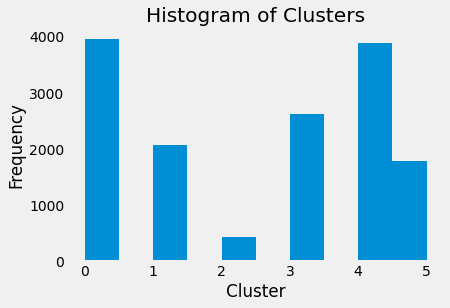

In [516]:
centroids = km.cluster_centers_
# The histogram of the clusters
plt.hist(df_train['CLUSTER'])
plt.title('Histogram of Clusters')
plt.xlabel('Cluster')
plt.ylabel('Frequency')
plt.grid()
plt.show()

In [517]:
# means of the clusters
df_train.groupby('CLUSTER').mean()

,RESIDENTIAL UNITS,LAND SQUARE FEET,NEIGHBORHOOD_CAT,BUILDING CLASS CATEGORY_CAT,TAX CLASS AT PRESENT_CAT,BLOCK_CAT,BUILDING CLASS AT PRESENT_CAT,ADDRESS_CAT,ZIP CODE_CAT,YEAR BUILT_CAT,TAX CLASS AT TIME OF SALE_CAT,BUILDING CLASS AT TIME OF SALE_CAT,SALE PRICE,LN SALE PRICE
CLUSTER,,,,,,,,,,,,,,
0,6.371999,3257.129391,20.451352,10.271670,4.377559,615.246146,51.788982,2200.249179,17.234016,51.535254,1.058630,50.716705,0.140942,0.476911
1,68.733172,15091.481356,28.895884,9.082324,4.055690,291.045036,37.578692,4234.666344,27.269734,47.934140,1.015012,36.825182,0.107710,0.423241
2,23.405963,25441.071101,24.520642,9.669725,3.938073,246.133028,49.295872,4340.575688,21.924312,57.665138,1.027523,50.896789,0.092304,0.418916
3,26.130948,7690.148078,23.609821,9.151504,4.276361,583.451466,37.991625,6390.044157,19.555386,45.687476,1.057099,36.627332,0.090467,0.386143
4,6.094063,2772.826780,20.412233,9.990491,4.343870,570.760730,53.546903,6588.873554,19.410177,52.696736,1.046518,52.129530,0.122134,0.451770
5,31.447309,9360.901345,27.276345,9.282511,4.296525,437.243834,44.012332,1992.389574,24.670964,49.935538,1.068386,42.599776,0.101864,0.414283


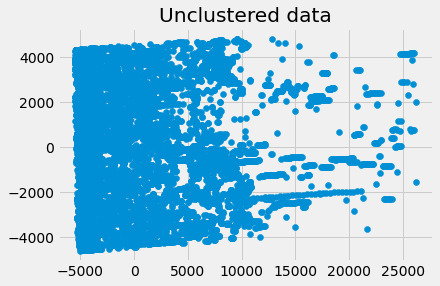

In [518]:
# 2D plot of the unclustered data
pca_data = PCA(n_components=cluster_amount).fit(X)
pca_2d = pca_data.transform(X)
plt.scatter(pca_2d[:,0], pca_2d[:,1])
plt.title('Unclustered data')
plt.show()

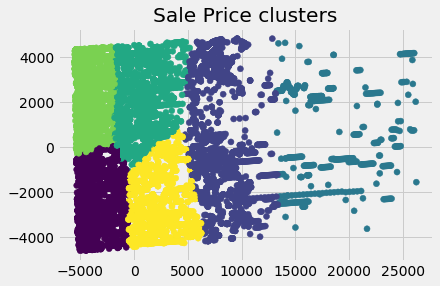

In [519]:
# 2D plot of the clusters
plt.scatter(pca_2d[:,0], pca_2d[:,1], c=clust_labels)
plt.title('Sale Price clusters')
plt.show()

### Part 2.3



In [491]:
regressors = []
for i in range(cluster_amount):   # Iterate through the cluster amount
  print(i)
  # get the data points that belong to the i-th cluster
  cluster_X = df_train.loc[df_train['CLUSTER'] == i]
  cluster_y = df_train.loc[df_train['CLUSTER'] == i]["LN SALE PRICE"]

  # Create a training/testing split from the cluster_x/cluster_y obtained
  X_train, X_test, Y_train, Y_test = train_test_split(cluster_X, cluster_y, test_size=0.25, random_state=42)

  # Assign the data to a RF regressor.
  rf = RandomForestRegressor(n_estimators = 1400, min_samples_split = 5, min_samples_leaf = 1, max_features = "sqrt", max_depth = 30, bootstrap = True, random_state = 42)
  rf.fit(X_train, Y_train)

  cross_val_mean(rf, X_test, Y_test)

  regressors.append(rf) # Add the model to the regressors model to be used for later

0
Mean R2 Accuracy:  0.9834700650444796
1
Mean R2 Accuracy:  0.9745653111387823
2
Mean R2 Accuracy:  0.8885059005764672
3
Mean R2 Accuracy:  0.9754587981228608
4
Mean R2 Accuracy:  0.972492780357575
5
Mean R2 Accuracy:  0.9864535933121514


In [492]:
from sklearn.ensemble import VotingRegressor

# Assume regressors is a list of regression models

# Create a list of tuples containing the name and model of each regressor
estimators = [('regressor{}'.format(i), regressors[i]) for i in range(len(regressors))]

# Create a voting regressor object (An ensemble model pretty much) 
er = VotingRegressor(estimators)

# Fit the ensemble regressor to the data
er.fit(X_train, Y_train)

VotingRegressor(estimators=[('regressor0',
                             RandomForestRegressor(max_depth=30,
                                                   max_features='sqrt',
                                                   min_samples_split=5,
                                                   n_estimators=1400,
                                                   random_state=42)),
                            ('regressor1',
                             RandomForestRegressor(max_depth=30,
                                                   max_features='sqrt',
                                                   min_samples_split=5,
                                                   n_estimators=1400,
                                                   random_state=42)),
                            ('regressor2',
                             RandomForestRegressor(max_depth=30,
                                                   max_features='sqrt',
                                                   min...
                             RandomForestRegressor(max_depth=30,
                                                   max_features='sqrt',
                                                   min_samples_split=5,
                                                   n_estimators=1400,
                                                   random_state=42)),
                            ('regressor4',
                             RandomForestRegressor(max_depth=30,
                                                   max_features='sqrt',
                                                   min_samples_split=5,
                                                   n_estimators=1400,
                                                   random_state=42)),
                            ('regressor5',
                             RandomForestRegressor(max_depth=30,
                                                   max_features='sqrt',
                                                   min_samples_split=5,
                                                   n_estimators=1400,
                                                   random_state=42))])

In [493]:
cross_val_mean(er, X_test, Y_test) #Print the score of the ensemble model

Mean R2 Accuracy:  0.9864535933121514
